In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import folium

In [2]:
df = pd.read_csv('kc_house_data_clean.csv')
df.head()

,Unnamed: 0,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,...,long,sqft_living15,sqft_lot15,year,month,day,month_year,price_bands,price_list_level,yr_built_bands
0,0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0.0,...,-122.257,1340,5650,2014,10,13,13-2014,200K to 300K,3,1950
1,1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,...,-122.319,1690,7639,2014,12,9,9-2014,500K to 600K,6,1950
2,2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,...,-122.233,2720,8062,2015,2,25,25-2015,100K to 200K,2,1930
3,3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,...,-122.393,1360,5000,2014,12,9,9-2014,600K to 700K,7,1960
4,4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,...,-122.045,1800,7503,2015,2,18,18-2015,500K to 600K,6,1980


In [3]:
df.columns

Index(['Unnamed: 0', 'id', 'date', 'price', 'bedrooms', 'bathrooms',
       'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition',
       'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated',
       'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year',
       'month', 'day', 'month_year', 'price_bands', 'price_list_level',
       'yr_built_bands'],
      dtype='object')

Make a list of locations.

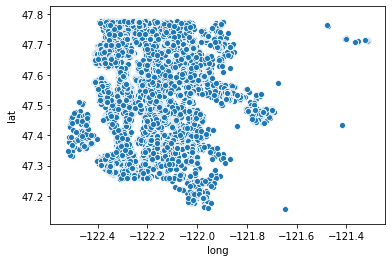

In [4]:
sns.scatterplot(data=df, x="long", y="lat")

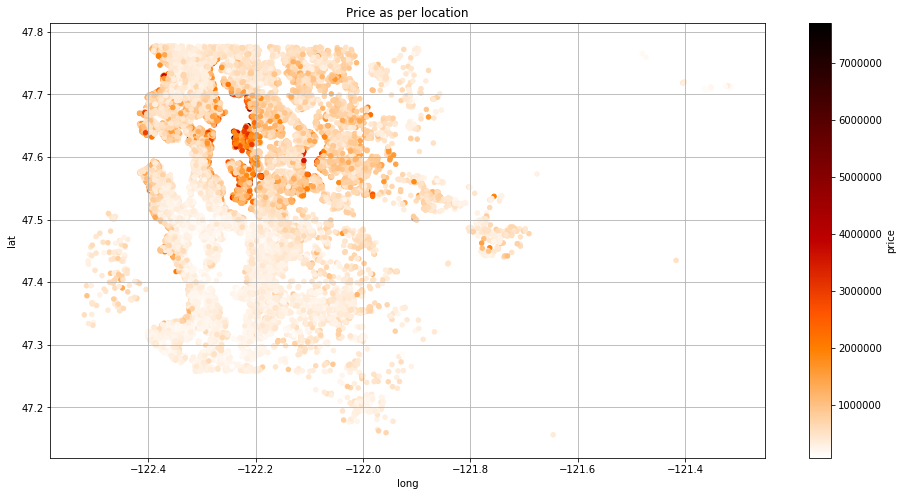

In [5]:
df.plot(kind="scatter", x="long", y="lat", figsize=(16, 8), c="price",
             cmap="gist_heat_r", colorbar=True, sharex=False)
plt.grid(which='both')
plt.title('Price as per location')
plt.show()

In [6]:
now = 2016

In [7]:
df['age'] = now - df['yr_built']

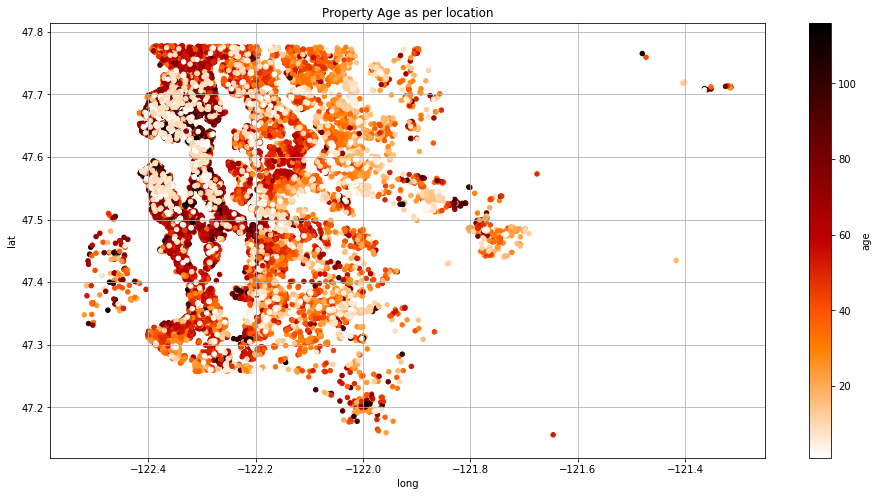

In [8]:
df.plot(kind="scatter", x="long", y="lat", figsize=(16, 8), c="age",
             cmap="gist_heat_r", colorbar=True, sharex=False)
plt.grid(which='both')
plt.title('Property Age as per location')
plt.show()

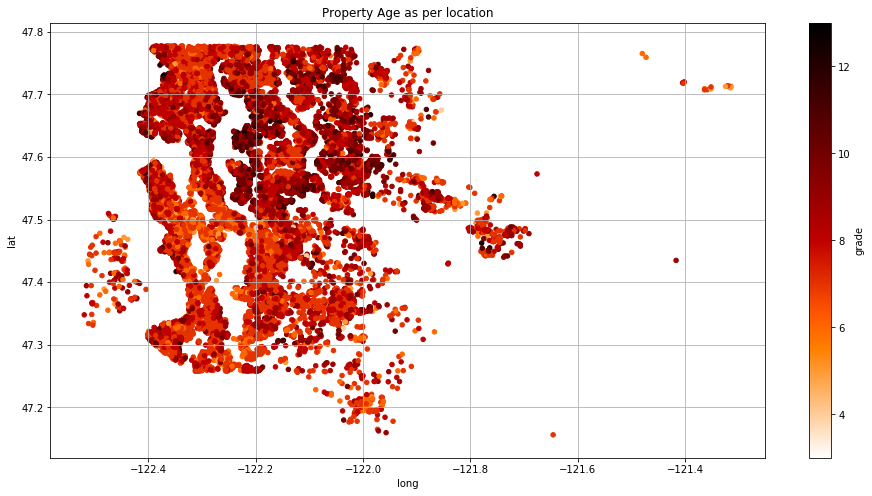

In [9]:
df.plot(kind="scatter", x="long", y="lat", figsize=(16, 8), c="grade",
             cmap="gist_heat_r", colorbar=True, sharex=False)
plt.grid(which='both')
plt.title('Property Age as per location')
plt.show()

In [30]:
df_low_grade = df.loc[df['grade'] < 7]
df_low_grade.shape

(2308, 30)

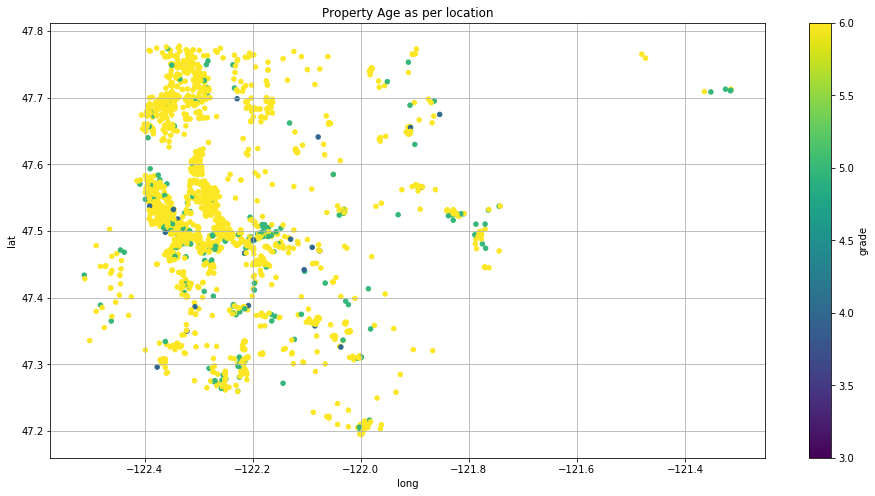

In [28]:
df_low_grade.plot(kind="scatter", x="long", y="lat", figsize=(16, 8), c="grade",
             cmap="viridis", colorbar=True, sharex=False)
plt.grid(which='both')
plt.title('Property Age as per location')
plt.show()

In [32]:
df_low_grade_above_avg_age = df.loc[(df['grade'] < 7) & (df['age'] > 53)]
df_low_grade_above_avg_age.shape

(2007, 30)

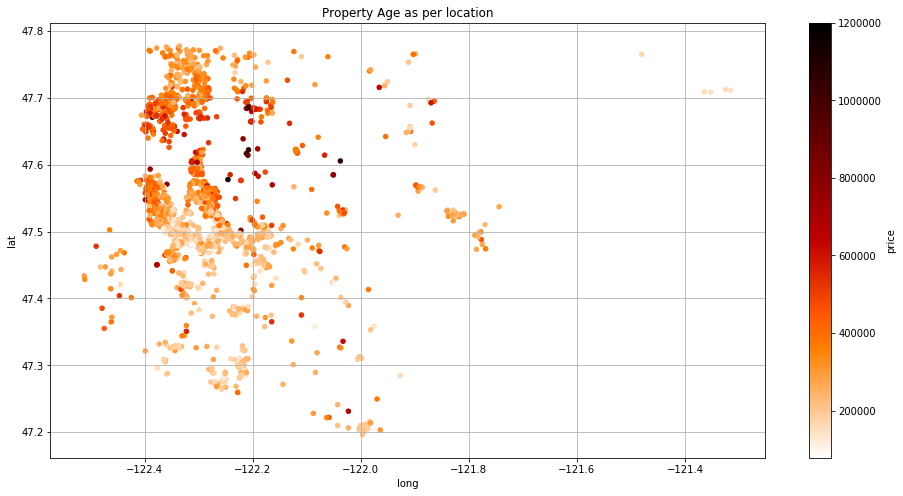

In [34]:
df_low_grade_above_avg_age.plot(kind="scatter", x="long", y="lat", figsize=(16, 8), c="price",
             cmap="gist_heat_r", colorbar=True, sharex=False)
plt.grid(which='both')
plt.title('Property Age as per location')
plt.show()

## Locations Arrays

In [10]:
list_long = np.array(df['long'])
list_long[:5]

array([-122.257, -122.319, -122.233, -122.393, -122.045])

In [11]:
list_lat = np.array(df['lat'])
list_lat[:5]

array([47.5112, 47.721 , 47.7379, 47.5208, 47.6168])

In [12]:
list_grade = np.array(df['grade'])
list_grade[:5]

array([7, 7, 6, 7, 8], dtype=int64)

## Basic Map

Just using the the first location as a starting point

In [13]:
map_basic = folium.Map(location=[47.5112, -122.257], zoom_start=10)

In [14]:
map_basic

## Check if markers work:

In [15]:
marker_test = folium.CircleMarker(location = [47.5112, -122.257], radius = 1)
marker_test.add_to(map_basic)

In [16]:
map_basic

Make the lat & long into markers.

In [17]:
def to_marker(location):
    return folium.CircleMarker(location=location, radius = 1)

In [18]:
# locations = list(zip(list_lat, list_long))

Make into list of in list: [ [lat, long] , [lat, long], ...]

In [19]:
def get_location(list_lat, list_long):
    new_list = []
    i = 0
    for lat in list_lat:
        temp = []
        temp.append(lat)
        temp.append(list_long[i])
        new_list.append(temp)
        i += 1
    return new_list
        

In [20]:
locations = get_location(list_lat, list_long)
locations[:5]

[[47.5112, -122.257],
 [47.721, -122.319],
 [47.7379, -122.233],
 [47.5208, -122.393],
 [47.6168, -122.045]]

In [21]:
markers = list(map(to_marker, locations))
markers

 ...]

Add the markers to the map

In [41]:
test_maker_1 = to_marker(locations[5])

In [42]:
test_maker_1.add_to(map_basic)

In [22]:
def markers_to_map(markers, map_obj):
    for marker in markers:
        marker.add_to(map_obj)
    return map_obj

In [23]:
# marker_maps = list(zip(markers, [map_basic]*len(markers)))
# map(markers_to_map, list(zip(markers, [map_basic]*len(markers))))
# markers[2].add_to(map_basic)

In [40]:
markers_to_map(markers, map_basic)

# Zipcode Maps

In [35]:
df_zipcodes = pd.read_csv('Zipcodes_for_King_County_and_Surrounding_Area__zipcode_area.csv')

In [37]:
df_zipcodes

,OBJECTID,ZIP,ZIPCODE,COUNTY,ZIP_TYPE,Shape_Length,Shape_Area
0,1,98031,98031,33.0,Standard,117508.232813,2.280129e+08
1,2,98032,98032,33.0,Standard,166737.665152,4.826754e+08
2,3,98030,98030,33.0,Standard,94409.538568,2.000954e+08
3,4,98029,98029,33.0,Standard,111093.715481,2.774247e+08
4,5,98028,98028,33.0,Standard,71488.230747,1.996531e+08
...,...,...,...,...,...,...,...
199,200,98580,98580,53.0,Standard,234421.906428,1.813778e+09
200,201,98467,98467,53.0,Standard,65464.825750,1.545827e+08
201,202,98498,98498,53.0,Standard,94191.629821,2.715042e+08
202,203,98946,98946,37.0,Standard,148179.572807,8.366639e+08


In [39]:
# Set zipcode type to string (folium)
df_zipcodes['ZIPCODE'] = df_zipcodes['ZIPCODE'].astype('str')
# get the mean value across all data points
zipcode_data = df_zipcodes.groupby('ZIPCODE').aggregate(np.mean)
zipcode_data.reset_index(inplace = True)